## VISUALIZE
- A Jupyter notebook to help display the inputs of the model as well as it's weights

In [1]:
from game import Game
from agent import PongAgent
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import math
import numpy as np

# Define your model architecture
def build_model():
    p = PongAgent(0, 1)
    return p.model

pygame 2.6.1 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


/Users/quimbo/Documents/Code/PongRL/.venv/lib/python3.11/site-packages/keras/src/export/tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


## Display model inputs:

- The model takes in a 280 x 120 grid of pixels.
- The color values encode things like velocity and object type.
- We can display the model's inputs over time as a video

In [2]:
s = Game(**{'obstacles':2, 'jupyter':1, 'nn':0, 'vision':True})

p1_list = []
p2_list = []
for _ in range(500):
    ns = s.step({'p1':0,'p2':0})
    p1_list.append(s.get_state(0))
    p2_list.append(s.get_state(1))

s.end()


### P1 Perspective

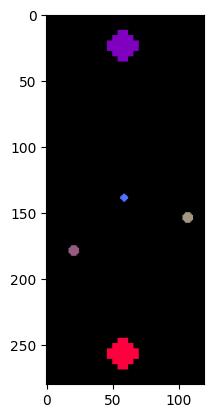

In [3]:
fig, ax = plt.subplots()
img_display = ax.imshow(p1_list[0][0])
def update_frame(i):
    img_display.set_data(p1_list[i][0])
    return [img_display]
ani = animation.FuncAnimation(fig, update_frame, frames=len(p1_list), interval=1)
HTML(ani.to_jshtml())

### P2 Perspective

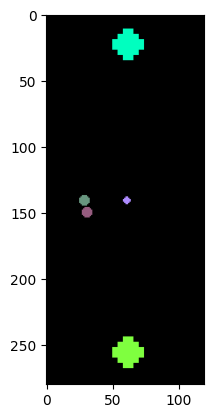

In [4]:
fig, ax = plt.subplots()
img_display = ax.imshow(p2_list[0][0])
def update_frame(i):
    img_display.set_data(p2_list[i][0])
    return [img_display]
ani = animation.FuncAnimation(fig, update_frame, frames=len(p2_list), interval=1)
HTML(ani.to_jshtml())

## Visualize model weights
- For convolutional layers we can display the weights as color images for each of the dimensions
- For dense layers we can plot the weights mapping to the next layer's neurons as an image

In [ ]:


model = build_model()
# model.load_weights('./models/trained_agent.weights.h5')

for layer_idx, layer in enumerate(model.layers):        
    if 'conv' in layer.name:
        filters, biases = layer.get_weights()
        filters = (filters - filters.min()) / (filters.max() - filters.min())
        num_filters = filters.shape[-1]
        grid_size = math.ceil(math.sqrt(num_filters))

        fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size*2, grid_size*2))
        fig.suptitle(f'Layer {layer_idx + 1}: {layer.name}', fontsize=16)
        
        for i in range(grid_size * grid_size):
            row, col = divmod(i, grid_size)
            ax = axes[row, col] if grid_size > 1 else axes
            
            if i < num_filters:
                kernel = filters[..., i]

                if kernel.shape[-1] == 3:
                    for j in range(3):
                        ax.imshow(kernel[..., j])
                        ax.axis('off')
                else:
                    ax.imshow(kernel[..., 0])
                    ax.axis('off')
            else:
                ax.axis('off')
        plt.show()

    if 'conv' in layer.name:
        filters, biases = layer.get_weights()
        # Assuming the filter shape is (x, y, 3, num_filters)
        x, y, channels, _, num_filters = filters.shape
        
        # Create a grid to arrange the filters
        grid_size = int(np.ceil(np.sqrt(num_filters)))
        
        # Create a single image to hold all the filters
        filter_image = np.zeros((grid_size * x, grid_size * y, channels))
        
        # Populate the filter image
        try:
            for i in range(num_filters):
                row = i // grid_size
                col = i % grid_size
                cur = np.reshape(filters[..., i], shape=(x, y, channels))
                filter_image[row*x:(row+1)*x, col*y:(col+1)*y, :] = cur
        except Exception as e:
            print(e)
        # Normalize the filter image for better visualization
        filter_image = (filter_image - filter_image.min()) / (filter_image.max() - filter_image.min())
        
        # Display the filter image
        plt.figure(figsize=(10, 10))
        plt.imshow(filter_image)
        plt.axis('off')
        plt.show()

    if 'dense' in layer.name:
        weights, biases = layer.get_weights()

        plt.figure(figsize=(20, 12))
        plt.imshow(weights, aspect='auto', cmap='ocean')
        plt.colorbar()
        plt.title(f'Layer {layer_idx + 1}: {layer.name} - Dense Weights')
        plt.xlabel('Neurons in Next Layer')
        plt.ylabel('Neurons in Current Layer')
        plt.show()